In [2]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
import properscoring as ps

path = '/Users/Guille/Desktop/caiso_power/results/predictions/'

In [3]:
name = '567-63_1110_00_11_12_pred.pkl'

file  = open(path + name,'rb')
data_ = pickle.load(file)
file.close()

print(len(data_))

Y_, M_hat_, S2_hat_, Y_hat_, Y_joint_hat_ = data_
print(Y_.shape, M_hat_.shape, S2_hat_.shape, Y_hat_.shape, Y_joint_hat_.shape)

Y_hat_[Y_hat_ < 0.] = 0.
Y_joint_hat_[Y_joint_hat_ < 0.] = 0.

4


ValueError: not enough values to unpack (expected 5, got 4)

In [ ]:
def _ES(Y_, Y_hat_):
    N_observation, N_tasks, N_horizons, N_samples = Y_hat_.shape
    score_ = np.zeros((N_horizons, N_observation))
    for m in range(N_horizons):
        for i in range(N_observation):
            Y_p_   = np.tile(Y_[i, :, m], (N_samples, 1)).T
            frac1_ = np.sqrt(np.diag((Y_hat_[i, :, m, :] - Y_p_).T @ (Y_hat_[i, :, m, :] - Y_p_)))
            frac2_ = 0
            for j in range(N_samples):
                frac2_ += np.sqrt(np.sum((Y_hat_[i, :, m, :].T - Y_hat_[i, :, m, j])**2, axis = 1))

            score_[m, i] = np.sum(frac1_)/N_samples - np.sum(frac2_)/(2*(N_samples**2))
    return score_

def _VS(Y_, Y_hat_, p = .5):
    N_observation, N_tasks, N_horizons, N_samples = Y_hat_.shape
    score_ = np.zeros((N_horizons, N_observation))
    for n in range(N_horizons):
        for i in range(N_observation):
            frac1_ = np.absolute(np.subtract.outer(Y_[i, :, n], Y_[i, :, n]))**p
            frac2_ = np.zeros((N_tasks, N_tasks))
            for m in range(N_samples):
                frac2_ += np.absolute(np.subtract.outer(Y_hat_[i, :, n, m], Y_hat_[i, :, n, m]))**p
            score_[n, i] = np.sum((frac1_ - (frac2_/N_samples))**2)
    return score_

def _CRPS(Y_, Y_hat_):
    N_observation, N_tasks, N_horizons, N_samples = Y_hat_.shape
    score_ = np.zeros((N_horizons, N_observation, N_tasks))
    for i in range(N_horizons):
        for j in range(N_observation):
            for k in range(N_tasks):
                score_[i, j, k] = ps.crps_ensemble(Y_[j, k, i], Y_hat_[j, k, i, :])
                
    return score_
                                         
CRPS_ = _CRPS(Y_, Y_hat_[..., :])
print(CRPS_.mean())
ES_   = _ES(Y_, Y_hat_[..., :])
print(np.mean(ES_, axis = -1).mean())
VS_   = _VS(Y_, Y_hat_[..., :], p = .5)
print(np.mean(VS_, axis = -1).mean())

CRPS_ = _CRPS(Y_, Y_joint_hat_[..., :])
print(CRPS_.mean())
ES_   = _ES(Y_, Y_joint_hat_[..., :])
print(np.mean(ES_, axis = -1).mean())
VS_   = _VS(Y_, Y_joint_hat_[..., :], p = .5)
print(np.mean(VS_, axis = -1).mean())

# 243 3 24 1000
# 138.5988578297202
# 303.6885375697088
# 138.66027622351874
# 243 3 24 1000
# 138.66906507305393
# 305.9346579921328
# 186.71758941660423

# 140.00710926168978
# 306.102417795262
# 140.54322632368346
# 138.42899463992813
# 303.68875859714973
# 162.40600201848204

In [53]:
def _tVS(Y_, Y_hat_, p = .5):
    N_observation, N_tasks, N_horizons, N_samples = Y_hat_.shape
    
    score_ = np.zeros((N_tasks, N_observation))

    for i in range(N_tasks):
        for j in range(N_observation):
            frac1_ = np.absolute(np.subtract.outer(Y_[j, i, :], Y_[j, i, :]))**p
            frac2_ = np.zeros((N_horizons, N_horizons))
            for k in range(N_samples):
                frac2_ += np.absolute(np.subtract.outer(Y_hat_[j, i, :, k], Y_hat_[j, i, :, k]))**p
            score_[i, j] = np.sum((frac1_ - (frac2_/N_samples))**2)
    return score_


VS_  = _tVS(Y_, Y_hat_, p = .5)
print(np.mean(VS_, axis = -1).mean())

tVS_ = _tVS(Y_, Y_joint_hat_, p = .5)
print(np.mean(tVS_, axis = -1).mean())
#16449.598282963827
#20602.160726904967

# 16847.079933331894
# 18021.741464849543

15700.700810395489
16045.821578708781


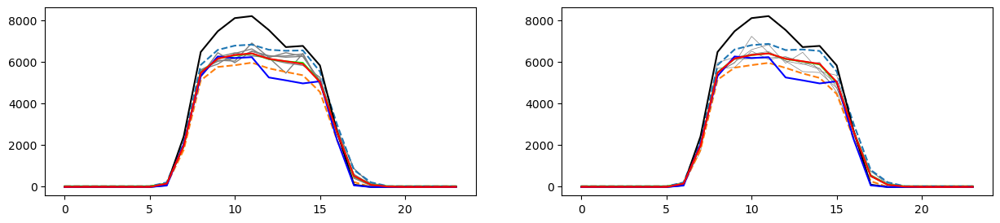

In [57]:
i_zone = 1

i_min = 240
plt.figure(figsize = (15, 3))
plt.subplot(121)
plt.plot(Y_hat_[i_min, i_zone, :, :5], 'gray', linewidth = 1.)
plt.plot(np.mean(Y_hat_[i_min, i_zone, :, :100], axis = -1), 'lime')
plt.plot(np.mean(Y_hat_[i_min, i_zone, :, :100], axis = -1) + 1.96*np.std(Y_hat_[i_min, i_zone, :, :1000], axis = -1), '--')
plt.plot(np.mean(Y_hat_[i_min, i_zone, :, :100], axis = -1) - 1.96*np.std(Y_hat_[i_min, i_zone, :, :1000], axis = -1), '--')

plt.plot(Y_[i_min, i_zone, :], 'k')
plt.plot(Y_[i_min - 1, i_zone, :], 'b')
plt.plot(M_hat_[i_min, i_zone, :], 'r')
#plt.ylim(0, 13000)

plt.subplot(122)
plt.plot(Y_joint_hat_[i_min, i_zone, :, :5], 'gray', linewidth = .5)
plt.plot(np.mean(Y_joint_hat_[i_min, i_zone, :, :100], axis = -1), 'lime')
plt.plot(np.mean(Y_joint_hat_[i_min, i_zone, :, :100], axis = -1) + 1.96*np.std(Y_joint_hat_[i_min, i_zone, :, :1000], axis = -1), '--')
plt.plot(np.mean(Y_joint_hat_[i_min, i_zone, :, :100], axis = -1) - 1.96*np.std(Y_joint_hat_[i_min, i_zone, :, :1000], axis = -1), '--')

plt.plot(Y_[i_min, i_zone, :], 'k')
plt.plot(Y_[i_min - 1, i_zone, :], 'b')
plt.plot(M_hat_[i_min , i_zone, :], 'r')

#plt.ylim(0, 13000)
plt.show()

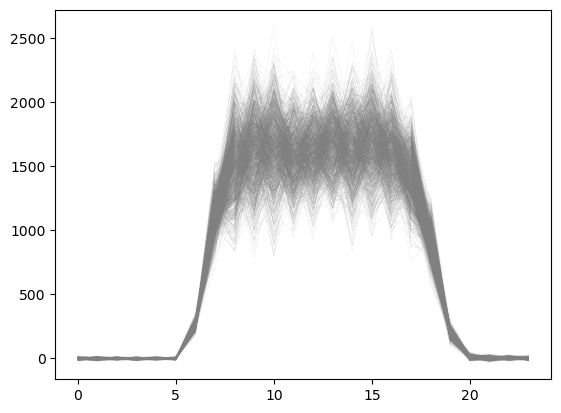

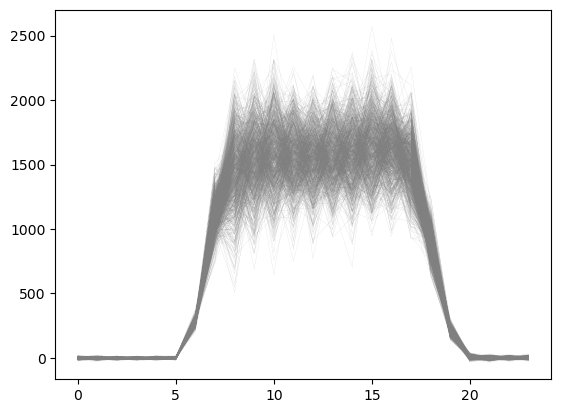

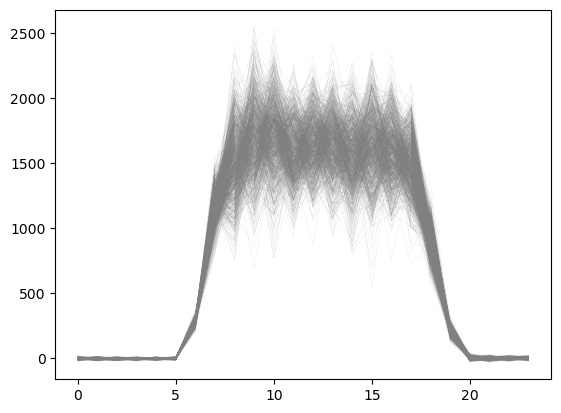

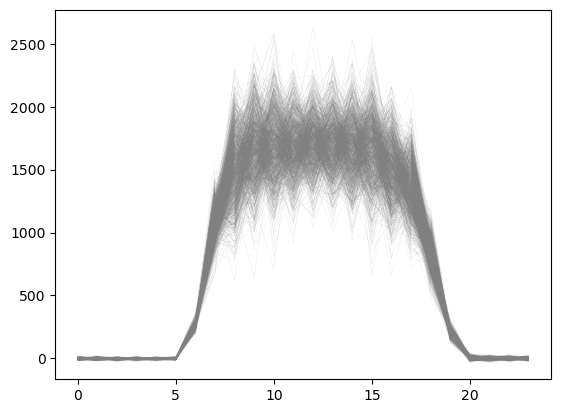

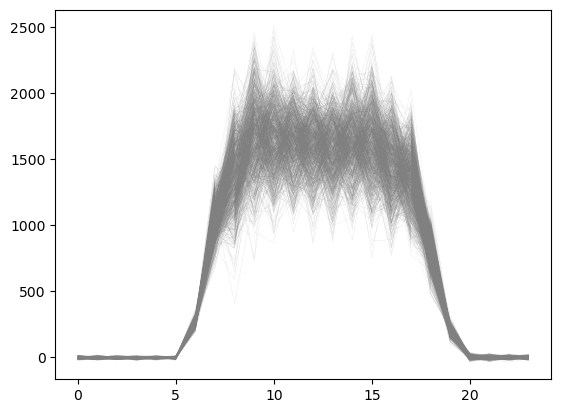

...

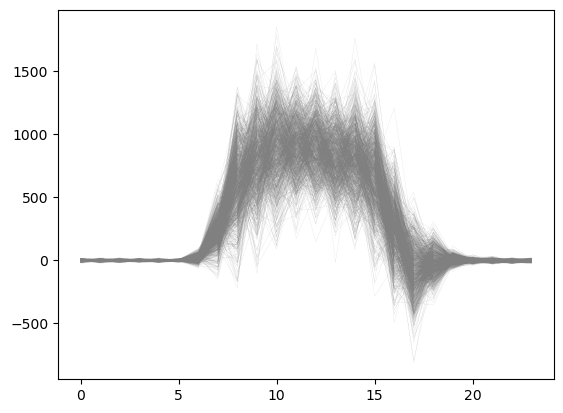

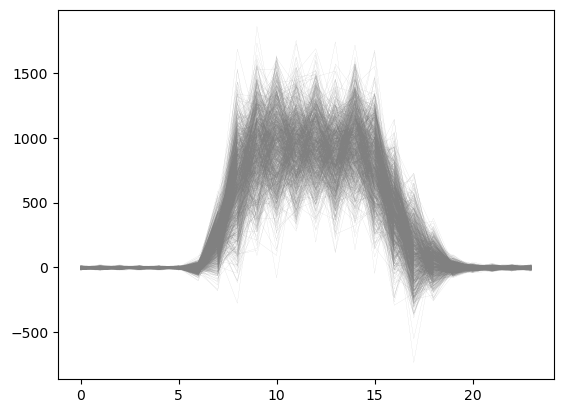

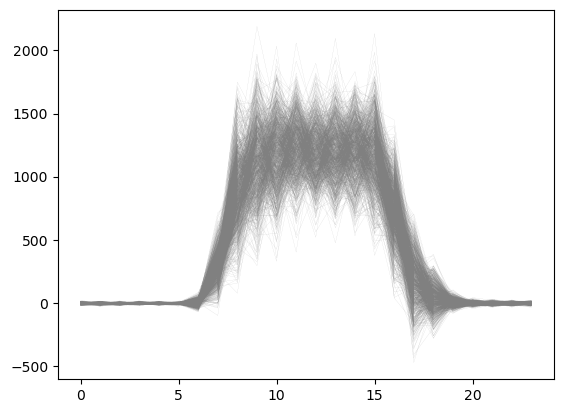

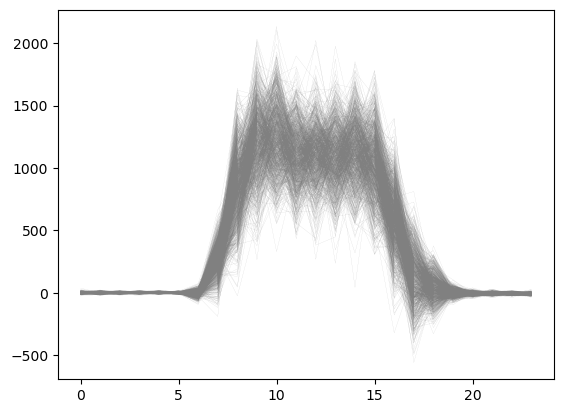

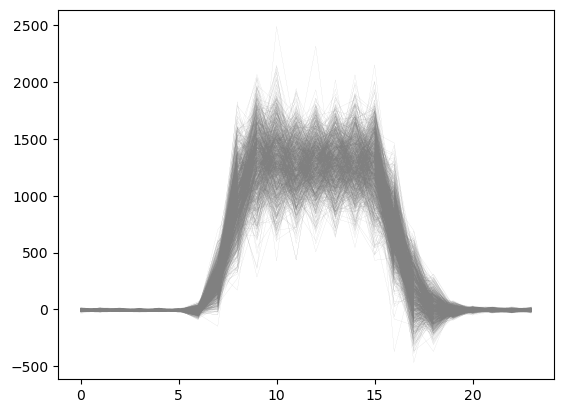

IndexError: index 243 is out of bounds for axis 0 with size 243

<Figure size 640x480 with 0 Axes>

In [ ]:


for i_obs in range(50, 1000, 1):
    plt.figure()
    plt.plot(Y_hat_[i_obs, 0, :, :1000], 'gray', linewidth = .05)
    # plt.plot(Y_[i_obs, 0, :] + Y_[i_obs, 1, :] + Y_[i_obs, 2, :], 'k')
    # plt.plot(Y_[i_obs - 1, 0, :] + Y_[i_obs - 1, 1, :] + Y_[i_obs - 1, 2, :], 'r')

    plt.show()
    
    plt.figure(figsize = (15, 4))
        
#     plt.subplot(131)
#     plt.plot(Y_hat_[i_obs, 0, :, :100], 'gray', linewidth = .05)
#     plt.plot(Y_[i_obs, 0, :], 'k')
#     plt.plot(M_hat_[i_obs, 0, :], 'r')
#     plt.ylim(10, 2500)

#     plt.subplot(132)
#     plt.plot(Y_hat_[i_obs, 1, :, :100], 'gray', linewidth = .05)
#     plt.plot(Y_[i_obs, 1, :], 'k')
#     plt.plot(M_hat_[i_obs, 1, :], 'r')
#     plt.ylim(10, 12500)

#     plt.subplot(133)
#     plt.plot(Y_hat_[i_obs, 2, :, :100], 'gray', linewidth = .05)
#     plt.plot(Y_[i_obs, 2, :], 'k')
#     plt.plot(M_hat_[i_obs, 2, :], 'r')
#     plt.ylim(10, 3000)
#     plt.show()

1740.1850782004021
